In [1]:
#!pip install --user pillow
#!pip install --user python-dotenv

In [1]:
import json, os
from IPython import display

In [2]:
#imgurl="../../images/Sanssouci.jpg"
imgurl="../../images/bueste.jpg"
display.Image(url=imgurl)

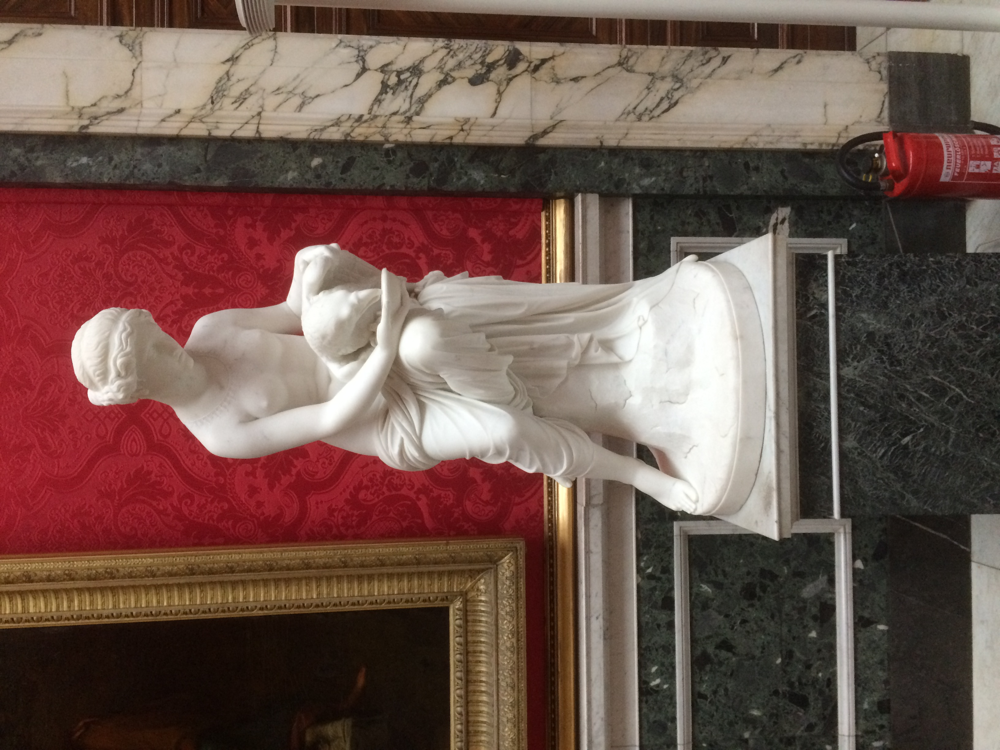

In [3]:
with open(imgurl, "rb") as fp:
    rawdata = fp.read()
display.Image(data=rawdata)

In [4]:
from PIL import Image
import io
im = Image.open(io.BytesIO(rawdata))

In [6]:
print(imgurl, im.format, "%dx%d" % im.size, im.mode)

../../images/bueste.jpg JPEG 3264x2448 RGB


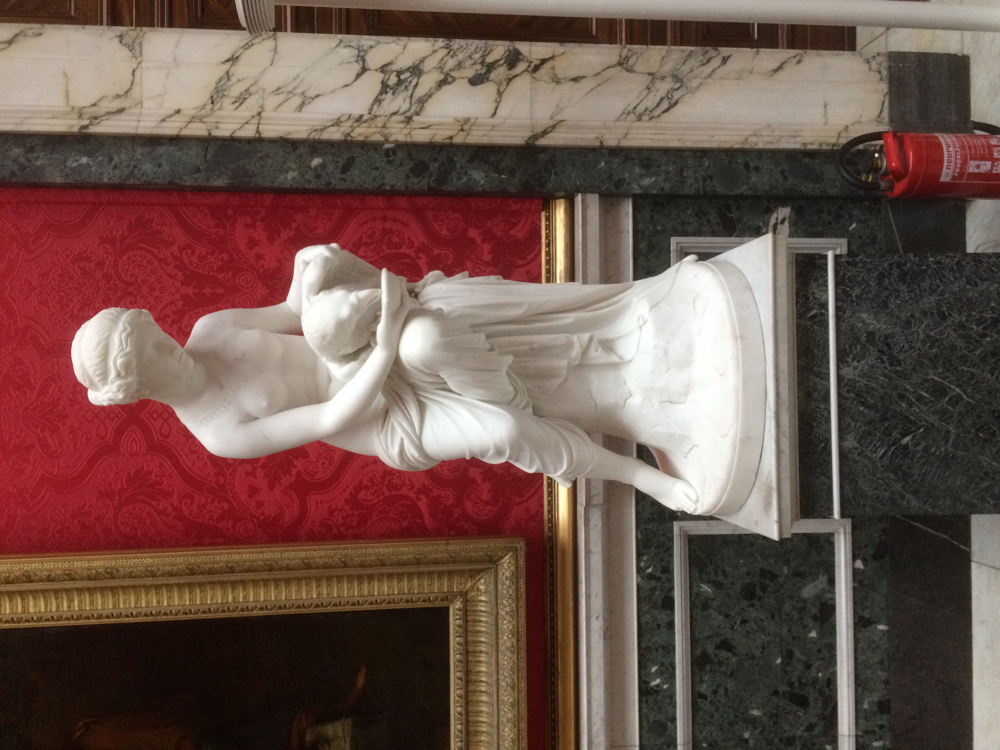

In [7]:
im

In [8]:
thumb_size = (512,512)
im.thumbnail(thumb_size)

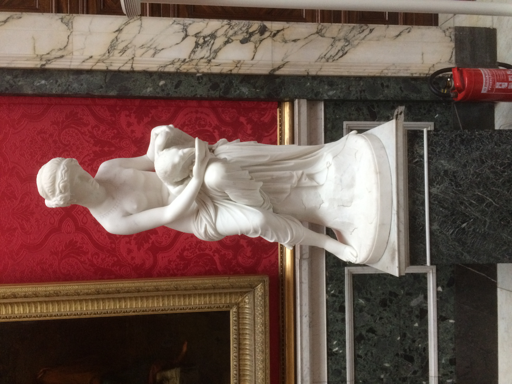

In [9]:
im

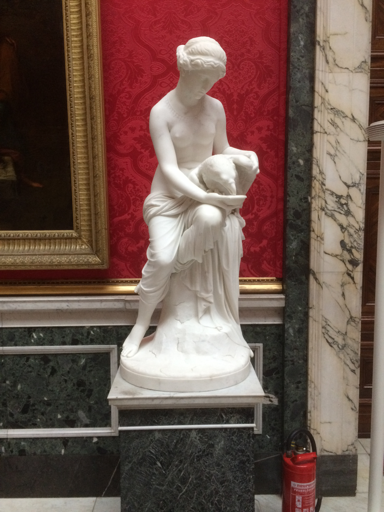

In [10]:
rot_im = im.rotate(270, expand=1)
rot_im

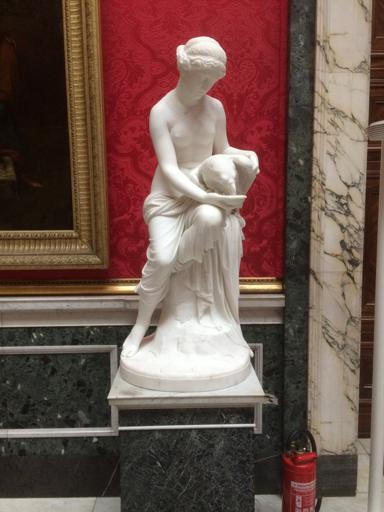

In [11]:
buf = io.BytesIO()
rot_im.save(buf,"JPEG")
display.Image(data=buf.getvalue())

In [12]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
from fractions import Fraction

class ImageMetaData(object):
    '''
    Extract the exif data from any image. Data includes GPS coordinates, 
    Focal Length, Manufacture, and more.
    '''
    exif_data = None
    image = None

    def __init__(self, image):
        self.image = image
        #print(self.image._getexif())
        self.get_exif_data()
        super(ImageMetaData, self).__init__()

    def get_exif_data(self):
        """Returns a dictionary from the exif data of an PIL Image item. Also converts the GPS Tags"""
        exif_data = {}
        info = self.image._getexif()
        if info:
            for tag, value in info.items():
                decoded = TAGS.get(tag, tag)
                if decoded == "GPSInfo":
                    gps_data = {}
                    for t in value:
                        sub_decoded = GPSTAGS.get(t, t)
                        gps_data[sub_decoded] = value[t]

                    exif_data[decoded] = gps_data
                else:
                    exif_data[decoded] = value
        self.exif_data = exif_data
        return exif_data

    def get_if_exist(self, data, key):
        if key in data:
            return data[key]
        return None

    def convert_to_degress(self, value):
        """Helper function to convert the GPS coordinates 
        stored in the EXIF to degress in float format"""
        d,m,s = map(lambda x: float(Fraction(x[0],x[1])), value)
        return d + (m / 60.0) + (s / 3600.0)

    def get_lat_lng(self):
        """Returns the latitude and longitude, if available, from the provided exif_data (obtained through get_exif_data above)"""
        lat = None
        lon = None
        exif_data = self.get_exif_data()
        if "GPSInfo" in exif_data:      
            gps_info = exif_data["GPSInfo"]
            gps_latitude = self.get_if_exist(gps_info, 'GPSLatitude')
            gps_latitude_ref = self.get_if_exist(gps_info, 'GPSLatitudeRef')
            gps_longitude = self.get_if_exist(gps_info, 'GPSLongitude')
            gps_longitude_ref = self.get_if_exist(gps_info, 'GPSLongitudeRef')

            if gps_latitude and gps_latitude_ref and gps_longitude and gps_longitude_ref:
                lat = self.convert_to_degress(gps_latitude)
                if gps_latitude_ref != 'N':
                    lat = 0 - lat

                lon = self.convert_to_degress(gps_longitude)
                if gps_longitude_ref != 'E':
                    lon = 0 - lon
                
        return lat, lon
    

In [13]:
meta_data = ImageMetaData(im)

In [14]:
exif_data = meta_data.get_exif_data()
exif_data

{'ApertureValue': (7983, 3509),
 'BrightnessValue': (3016, 7359),
 'ColorSpace': 1,
 'ComponentsConfiguration': b'\x01\x02\x03\x00',
 'DateTime': '2018:03:30 13:48:31',
 'DateTimeDigitized': '2018:03:30 13:48:31',
 'DateTimeOriginal': '2018:03:30 13:48:31',
 'ExifImageHeight': 2448,
 'ExifImageWidth': 3264,
 'ExifOffset': 206,
 'ExifVersion': b'0221',
 'ExposureBiasValue': (0, 1),
 'ExposureMode': 0,
 'ExposureProgram': 2,
 'ExposureTime': (1, 20),
 'FNumber': (11, 5),
 'Flash': 24,
 'FlashPixVersion': b'0100',
 'FocalLength': (83, 20),
 'FocalLengthIn35mmFilm': 29,
 'GPSInfo': {'GPSAltitude': (48, 1),
  'GPSAltitudeRef': b'\x00',
  'GPSDateStamp': '2018:03:30',
  'GPSDestBearing': (29005, 142),
  'GPSDestBearingRef': 'M',
  'GPSHPositioningError': (165, 1),
  'GPSImgDirection': (29005, 142),
  'GPSImgDirectionRef': 'M',
  'GPSLatitude': ((52, 1), (24, 1), (1837, 100)),
  'GPSLatitudeRef': 'N',
  'GPSLongitude': ((13, 1), (1, 1), (4610, 100)),
  'GPSLongitudeRef': 'E',
  'GPSSpeed': (0

In [15]:
latlng = meta_data.get_lat_lng()
print(latlng)

(52.40510277777778, 13.029472222222223)


In [16]:
#!pip install --user ipyleaflet

In [17]:
#!conda install -c conda-forge ipyleaflet
#!jupyter labextension install jupyter-leaflet
#!conda install -c conda-forge ipywidgets
#!jupyter labextension install @jupyter-widgets/jupyterlab-manager

In [18]:
from ipyleaflet import ( Map, Marker )

In [19]:
# show map
center = latlng
zoom = 100
m = Map(center=center, zoom=zoom)
mark = Marker(location=m.center)
m += mark
mark.interact(opacity=(0.0,1.0,0.01))
display.display(m)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map data (c) <a href="https://openstreetmap.org">OpenStreetMap</a> contributors'}, center=[52.40510277777778, 13.029472222222223], layers=(TileLayer(base=True, max_zoom=19, min_zoom=1, options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'tile_size']), Marker(location=[52.40510277777778, 13.029472222222223], options=['alt', 'clickable', 'draggable', 'keyboard', 'rise_offset', 'rise_on_hover', 'title', 'z_index_offset'])), options=['attribution_control', 'basemap', 'bounce_at_zoom_limits', 'box_zoom', 'center', 'close_popup_on_click', 'double_click_zoom', 'dragging', 'inertia', 'inertia_deceleration', 'inertia_max_speed', 'keyboard', 'keyboard_pan_offset', 'keyboard_zoom_offset', 'max_zoom', 'min_zoom', 'scroll_wheel_zoom', 'tap', 'tap_tolerance', 'touch_zoom', 'world_copy_jump', 'zoom', 'zoom_animation_threshold', 'zoom_control', 'zoom_start'], zoom=100)

In [20]:
from dotenv import load_dotenv, find_dotenv
load_dotenv(find_dotenv())
VISION_API_KEY = os.getenv("VISION_API_KEY")
print(VISION_API_KEY)

62508f63da9a4d60a0950b2705b7224c


In [21]:
import requests
# call image analyze service
vision_base_url = "https://westcentralus.api.cognitive.microsoft.com/vision/v1.0/"
vision_analyze_url = vision_base_url + "analyze"

headers    = {'Ocp-Apim-Subscription-Key': VISION_API_KEY, 
              "Content-Type": "application/octet-stream" }
params     = {'visualFeatures': 'Categories,Tags,Description,Color',
              'language':'en'}
response   = requests.post(vision_analyze_url, 
                           headers=headers, 
                           params=params, 
                           data=buf.getvalue())
response.raise_for_status()
analysis      = response.json()
analysis

{'categories': [{'name': 'object_sculpture', 'score': 0.86328125}],
 'color': {'accentColor': '9F2C32',
  'dominantColorBackground': 'Black',
  'dominantColorForeground': 'Grey',
  'dominantColors': ['Black', 'Grey', 'Red'],
  'isBwImg': False},
 'description': {'captions': [{'confidence': 0.7354030574649347,
    'text': 'a person standing in front of a statue'}],
  'tags': ['building',
   'outdoor',
   'white',
   'standing',
   'woman',
   'front',
   'man',
   'statue',
   'dress',
   'red',
   'sitting',
   'brick',
   'holding',
   'mirror',
   'wedding',
   'door',
   'large',
   'wearing',
   'walking',
   'street',
   'tall',
   'vase',
   'room',
   'clock']},
 'metadata': {'format': 'Jpeg', 'height': 512, 'width': 384},
 'requestId': '61777926-4b6a-4525-b3ab-ea992b5f2aa4',
 'tags': [{'confidence': 0.9977947473526001, 'name': 'building'}]}

A person standing in front of a statue


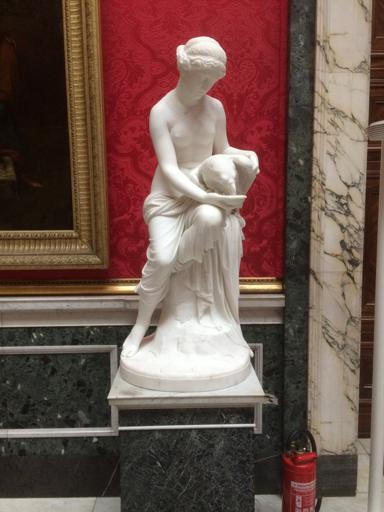

In [22]:
image_caption = analysis["description"]["captions"][0]["text"].capitalize()
print(image_caption)
display.Image(data=buf.getvalue())